In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from google.colab import files
import glob
from tqdm import tqdm
import os

In [ ]:
# Cell 2: File Upload
# -------------------
print("Please upload your data files (CSV/Excel)...")
uploaded = files.upload()
print(f"{len(uploaded)} files uploaded successfully!")

Please upload your data files (CSV/Excel)...


Saving merged_all_yearsAdarshN.csv to merged_all_yearsAdarshN.csv
Saving merged_all_yearsMansarovar.csv to merged_all_yearsMansarovar.csv
Saving merged_all_yearsMurlipur.csv to merged_all_yearsMurlipur.csv
Saving merged_all_yearsPoliceC.csv to merged_all_yearsPoliceC.csv
Saving merged_all_yearsShastrN.csv to merged_all_yearsShastrN.csv
Saving merged_all_yearsSitapur.csv to merged_all_yearsSitapur.csv
6 files uploaded successfully!


In [ ]:
# Cell 3: File Discovery
# ----------------------
file_paths = glob.glob("/content/*.xlsx") + glob.glob("/content/*.xls")
if not file_paths:
    print("No Excel files found. Checking for CSV files...")
    file_paths = glob.glob("/content/*.csv")

print(f"\nFiles to process:")
for i, f in enumerate(file_paths, 1):
    print(f"{i}. {os.path.basename(f)}")

No Excel files found. Checking for CSV files...

Files to process:
1. merged_all_yearsMurlipur.csv
2. merged_all_yearsSitapur.csv
3. merged_all_yearsShastrN.csv
4. merged_all_yearsAdarshN.csv
5. merged_all_yearsMansarovar.csv
6. merged_all_yearsPoliceC.csv


In [ ]:
# Cell 4: Data Loading
# --------------------
all_dfs = []
file_names = []

for f in tqdm(file_paths, desc="Loading files"):
    try:
        if f.endswith(('.xlsx', '.xls')):
            df = pd.read_excel(f)
        else:
            df = pd.read_csv(f)

        # Standardize timestamp
        df['Timestamp'] = pd.to_datetime(df['Timestamp'], errors='coerce')
        df = df.dropna(subset=['Timestamp'])

        print(f"{os.path.basename(f)}: {len(df)} rows | {df['Timestamp'].min()} to {df['Timestamp'].max()}")
        all_dfs.append(df)
        file_names.append(os.path.basename(f))
    except Exception as e:
        print(f"Error loading {f}: {str(e)}")

original_columns = all_dfs[0].columns.tolist() if all_dfs else []

Loading files:  33%|███▎      | 2/6 [00:00<00:00, 12.13it/s]

merged_all_yearsMurlipur.csv: 17544 rows | 2023-01-01 00:00:00 to 2024-12-31 23:00:00
merged_all_yearsSitapur.csv: 17544 rows | 2023-01-01 00:00:00 to 2024-12-31 23:00:00


Loading files:  67%|██████▋   | 4/6 [00:00<00:00,  6.45it/s]

merged_all_yearsShastrN.csv: 61368 rows | 2018-01-01 00:00:00 to 2024-12-31 23:00:00
merged_all_yearsAdarshN.csv: 61368 rows | 2018-01-01 00:00:00 to 2024-12-31 23:00:00
merged_all_yearsMansarovar.csv: 17544 rows | 2023-01-01 00:00:00 to 2024-12-31 23:00:00


Loading files: 100%|██████████| 6/6 [00:00<00:00,  7.07it/s]

merged_all_yearsPoliceC.csv: 61368 rows | 2018-01-01 00:00:00 to 2024-12-31 23:00:00


In [ ]:
# Cell 5: Timestamp Consolidation
# ------------------------------
all_timestamps = set()
for df in all_dfs:
    all_timestamps.update(df['Timestamp'].tolist())

unique_timestamps = sorted(all_timestamps)
print(f"\nFound {len(unique_timestamps)} unique timestamps across all files")
print(f"Date range: {unique_timestamps[0]} to {unique_timestamps[-1]}")


Found 61368 unique timestamps across all files
Date range: 2018-01-01 00:00:00 to 2024-12-31 23:00:00


In [ ]:
# Cell 6: Column Identification
# -----------------------------
non_num_cols = ['Timestamp', 'Month', 'Season']  # Will be preserved as-is
num_cols = [col for col in original_columns
            if col not in non_num_cols
            and pd.api.types.is_numeric_dtype(all_dfs[0][col])]

print("Columns identified:")
print(f"- Preserved as-is: {non_num_cols}")
print(f"- To be averaged: {num_cols}")

Columns identified:
- Preserved as-is: ['Timestamp', 'Month', 'Season']
- To be averaged: ['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO2 (µg/m³)', 'NH3 (µg/m³)', 'SO2 (µg/m³)', 'CO (mg/m³)', 'Ozone (µg/m³)', 'AT (°C)', 'RH (%)', 'WS (m/s)', 'WD (deg)', 'SR (W/mt2)', 'BP (mmHg)']


In [ ]:
# Cell 7: Precision Merging Engine
# -------------------------------
merged_data = []

for ts in tqdm(unique_timestamps, desc="Merging data"):
    # Collector for all values at this timestamp
    ts_data = {
        'non_num': {col: None for col in non_num_cols},
        'num': {col: [] for col in num_cols},
        'sources': set()
    }

    # Gather data from all files
    for df, name in zip(all_dfs, file_names):
        matches = df[df['Timestamp'] == ts]
        if not matches.empty:
            row = matches.iloc[0]
            ts_data['sources'].add(name)

            # Capture non-numerical data (first valid value)
            for col in non_num_cols:
                if pd.notna(row[col]) and ts_data['non_num'][col] is None:
                    ts_data['non_num'][col] = row[col]

            # Collect numerical values
            for col in num_cols:
                if pd.notna(row[col]):
                    ts_data['num'][col].append(row[col])

    # Build merged row
    merged_row = {'Timestamp': ts}
    merged_row.update(ts_data['non_num'])

    # Calculate averages
    for col in num_cols:
        vals = ts_data['num'][col]
        merged_row[col] = np.mean(vals) if vals else np.nan

    # Add metadata
    merged_row['_Sources'] = ','.join(sorted(ts_data['sources']))
    merged_row['_SampleCount'] = {col: len(ts_data['num'][col]) for col in num_cols}

    merged_data.append(merged_row)

print("Merging complete!")

Merging data: 100%|██████████| 61368/61368 [05:02<00:00, 202.79it/s]

Merging complete!


In [ ]:
# Cell 8: Final DataFrame Assembly
# -------------------------------
result_df = pd.DataFrame(merged_data)

# Reorder columns to match original
col_order = [col for col in original_columns if col in result_df.columns]
result_df = result_df[col_order + ['_Sources', '_SampleCount']]

# Cleanup
result_df = result_df.sort_values('Timestamp').reset_index(drop=True)
print(f"\nFinal merged data: {result_df.shape}")
print(result_df.head(3))


Final merged data: (61368, 18)
            Timestamp  PM2.5 (µg/m³)  PM10 (µg/m³)  NO2 (µg/m³)  NH3 (µg/m³)  \
0 2018-01-01 00:00:00     101.313333    160.160543    29.351020    23.526667   
1 2018-01-01 01:00:00     108.383333    153.783877    58.126667    18.766071   
2 2018-01-01 02:00:00      65.322903    162.277210    57.874701    30.849209   

   SO2 (µg/m³)  CO (mg/m³)  Ozone (µg/m³)    AT (°C)     RH (%)  WS (m/s)  \
0     4.936667    0.541450      41.661531  20.201474  48.525825  0.816629   
1     5.286667    0.604783      41.691531  16.309356  46.255825  0.709962   
2     5.493333    0.541450      40.524865  16.486023  44.815825  0.749962   

    WD (deg)  SR (W/mt2)   BP (mmHg)  Month  Season  \
0  95.705487  149.183262  758.995032    1.0  Winter   
1  93.012154  148.893262  758.928365    1.0  Winter   
2  95.725487  136.130000  762.215383    1.0  Winter   

                                            _Sources  \
0  merged_all_yearsAdarshN.csv,merged_all_yearsPo...   
1  me

In [ ]:
# Cell 9: Quality Assurance
# -------------------------
print("\nQuality Check Results:")

# 1. Check coverage
print(f"\n1. Data Coverage per File:")
file_coverage = {name: 0 for name in file_names}
for sources in result_df['_Sources']:
    for f in sources.split(','):
        file_coverage[f] += 1
for f, count in file_coverage.items():
    print(f"- {f}: {count} timestamps")

# 2. Check value counts
print("\n2. Average Values per Measurement:")
for col in num_cols:
    avg = result_df['_SampleCount'].apply(lambda x: x.get(col, 0)).mean()
    print(f"- {col}: {avg:.1f} values averaged")

# 3. Check for missing columns
missing = set(original_columns) - set(result_df.columns)
print("\n3. Missing Columns:", missing if missing else "None")


Quality Check Results:

1. Data Coverage per File:
- merged_all_yearsMurlipur.csv: 17544 timestamps
- merged_all_yearsSitapur.csv: 17544 timestamps
- merged_all_yearsShastrN.csv: 61368 timestamps
- merged_all_yearsAdarshN.csv: 61368 timestamps
- merged_all_yearsMansarovar.csv: 17544 timestamps
- merged_all_yearsPoliceC.csv: 61368 timestamps

2. Average Values per Measurement:
- PM2.5 (µg/m³): 3.9 values averaged
- PM10 (µg/m³): 3.9 values averaged
- NO2 (µg/m³): 3.9 values averaged
- NH3 (µg/m³): 3.9 values averaged
- SO2 (µg/m³): 3.9 values averaged
- CO (mg/m³): 3.9 values averaged
- Ozone (µg/m³): 3.9 values averaged
- AT (°C): 2.7 values averaged
- RH (%): 3.0 values averaged
- WS (m/s): 3.9 values averaged
- WD (deg): 3.9 values averaged
- SR (W/mt2): 2.9 values averaged
- BP (mmHg): 3.0 values averaged

3. Missing Columns: None


In [ ]:
# Cell 10: Export Results
# -----------------------
output_file = "merged_air_quality_data.csv"
result_df.to_csv(output_file, index=False)
files.download(output_file)
print(f"\nResults saved to {output_file} and downloaded!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


Results saved to merged_air_quality_data.csv and downloaded!


In [ ]:
df = pd.read_csv(output_file)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61368 entries, 0 to 61367
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Timestamp      61368 non-null  object 
 1   PM2.5 (µg/m³)  61368 non-null  float64
 2   PM10 (µg/m³)   61368 non-null  float64
 3   NO2 (µg/m³)    61368 non-null  float64
 4   NH3 (µg/m³)    61368 non-null  float64
 5   SO2 (µg/m³)    61368 non-null  float64
 6   CO (mg/m³)     61368 non-null  float64
 7   Ozone (µg/m³)  61368 non-null  float64
 8   AT (°C)        58440 non-null  float64
 9   RH (%)         61368 non-null  float64
 10  WS (m/s)       61368 non-null  float64
 11  WD (deg)       61368 non-null  float64
 12  SR (W/mt2)     61368 non-null  float64
 13  BP (mmHg)      61368 non-null  float64
 14  Month          61368 non-null  float64
 15  Season         61368 non-null  object 
 16  _Sources       61368 non-null  object 
 17  _SampleCount   61368 non-null  object 
dtypes: flo

In [ ]:
print("Initial data shape: ", df.shape)
print("\nMissing values:\n", df.isnull().sum())

Initial data shape:  (61368, 18)

Missing values:
 Timestamp           0
PM2.5 (µg/m³)       0
PM10 (µg/m³)        0
NO2 (µg/m³)         0
NH3 (µg/m³)         0
SO2 (µg/m³)         0
CO (mg/m³)          0
Ozone (µg/m³)       0
AT (°C)          2928
RH (%)              0
WS (m/s)            0
WD (deg)            0
SR (W/mt2)          0
BP (mmHg)           0
Month               0
Season              0
_Sources            0
_SampleCount        0
dtype: int64


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

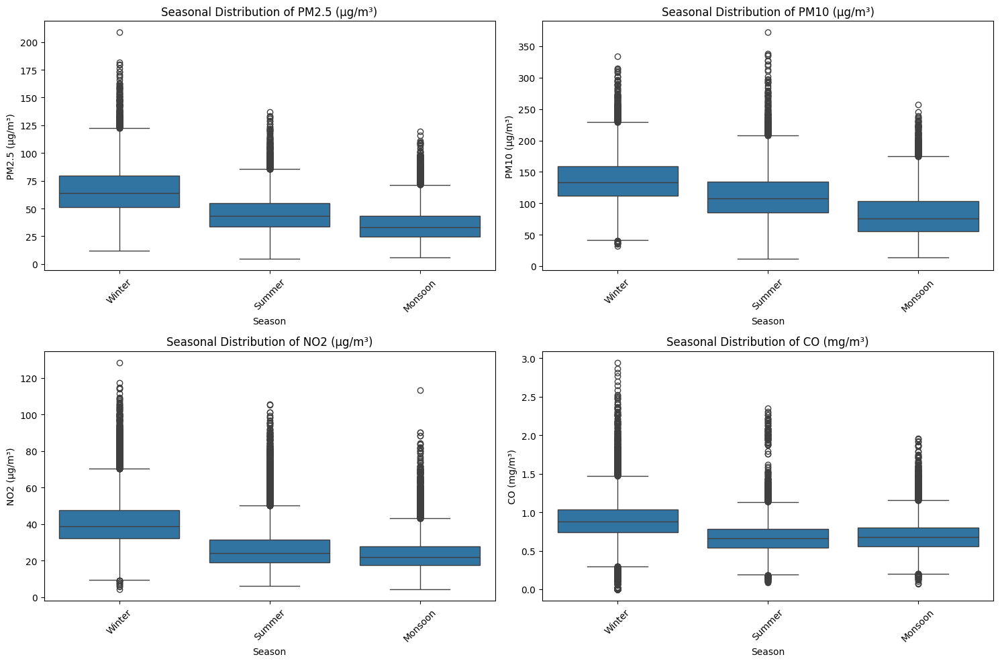

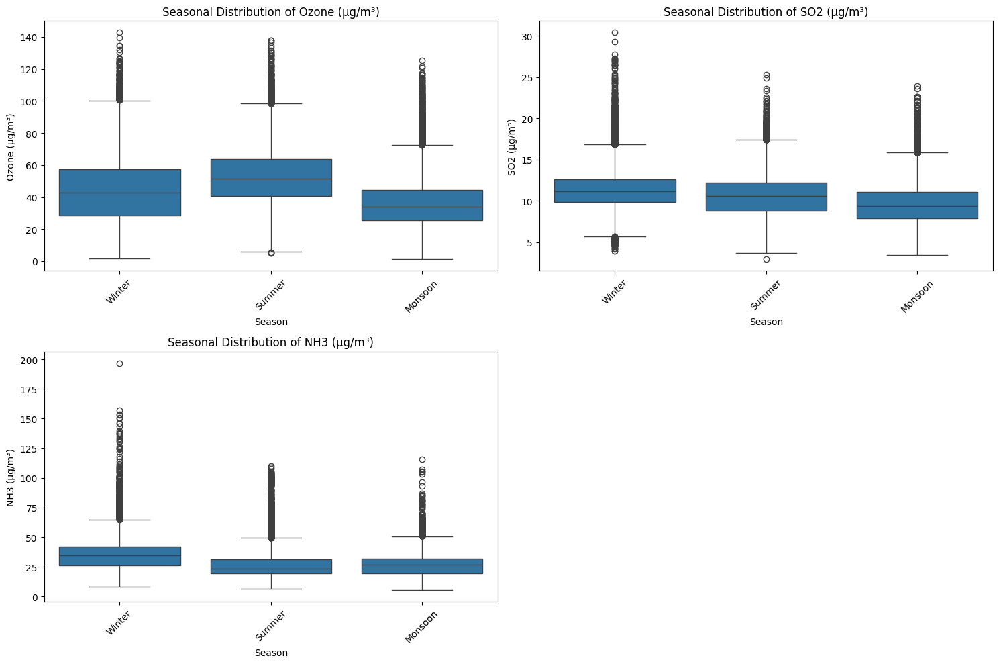

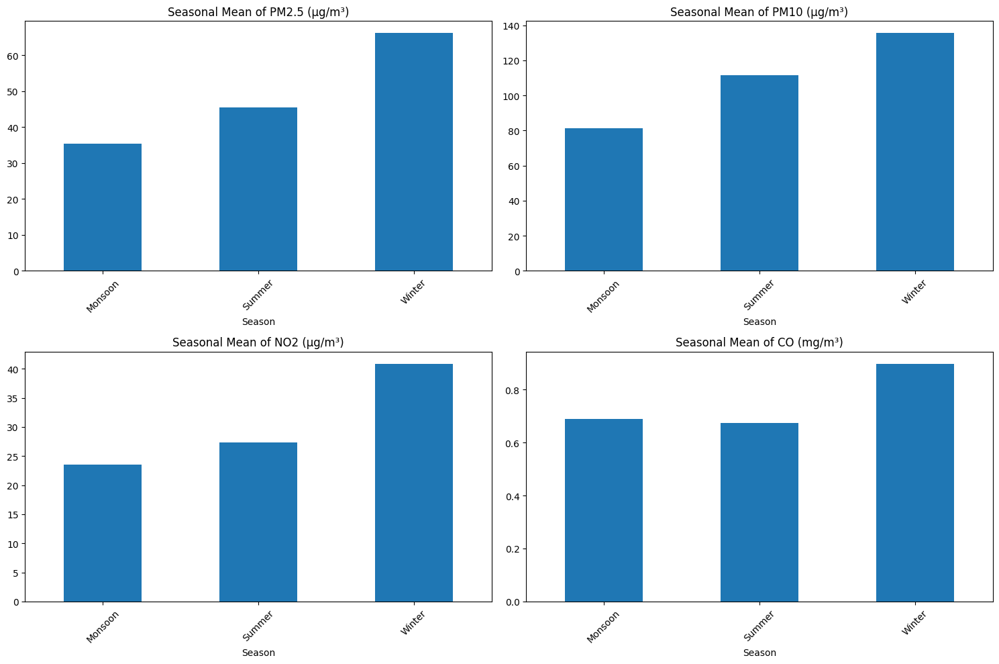

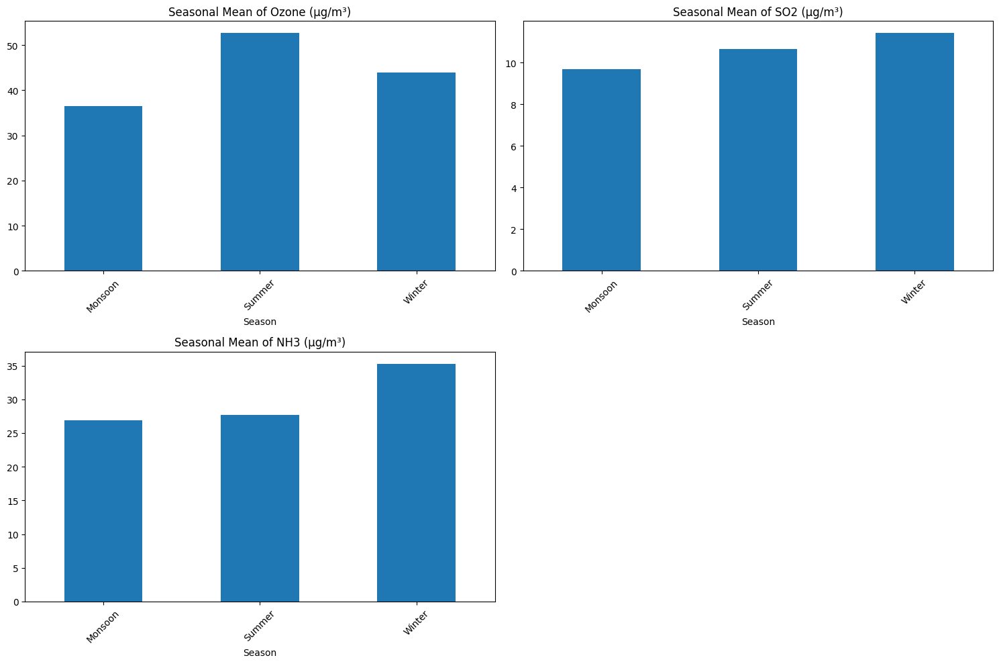

In [ ]:
# Plot pollutants in multiple figures
key_pollutants = ['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO2 (µg/m³)', 'CO (mg/m³)',
                 'Ozone (µg/m³)', 'SO2 (µg/m³)', 'NH3 (µg/m³)']

# Figure 1: First 4 pollutants boxplots
plt.figure(figsize=(15, 10))
for i, pollutant in enumerate(key_pollutants[:4], 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x='Season', y=pollutant, data=df)
    plt.title(f'Seasonal Distribution of {pollutant}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Figure 2: Remaining 3 pollutants boxplots
plt.figure(figsize=(15, 10))
for i, pollutant in enumerate(key_pollutants[4:], 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x='Season', y=pollutant, data=df)
    plt.title(f'Seasonal Distribution of {pollutant}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Figure 3: First 4 pollutants bar plots
plt.figure(figsize=(15, 10))
for i, param in enumerate(key_pollutants[:4], 1):
    plt.subplot(2, 2, i)
    df.groupby('Season')[param].mean().plot(kind='bar')
    plt.title(f'Seasonal Mean of {param}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Figure 4: Remaining 3 pollutants bar plots
plt.figure(figsize=(15, 10))
for i, param in enumerate(key_pollutants[4:], 1):
    plt.subplot(2, 2, i)
    df.groupby('Season')[param].mean().plot(kind='bar')
    plt.title(f'Seasonal Mean of {param}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Number of rows: 61368

Missing values in weather parameters:
RH (%): 0 missing values
WS (m/s): 0 missing values
BP (mmHg): 0 missing values
SR (W/mt2): 0 missing values
AT (°C): 2928 missing values


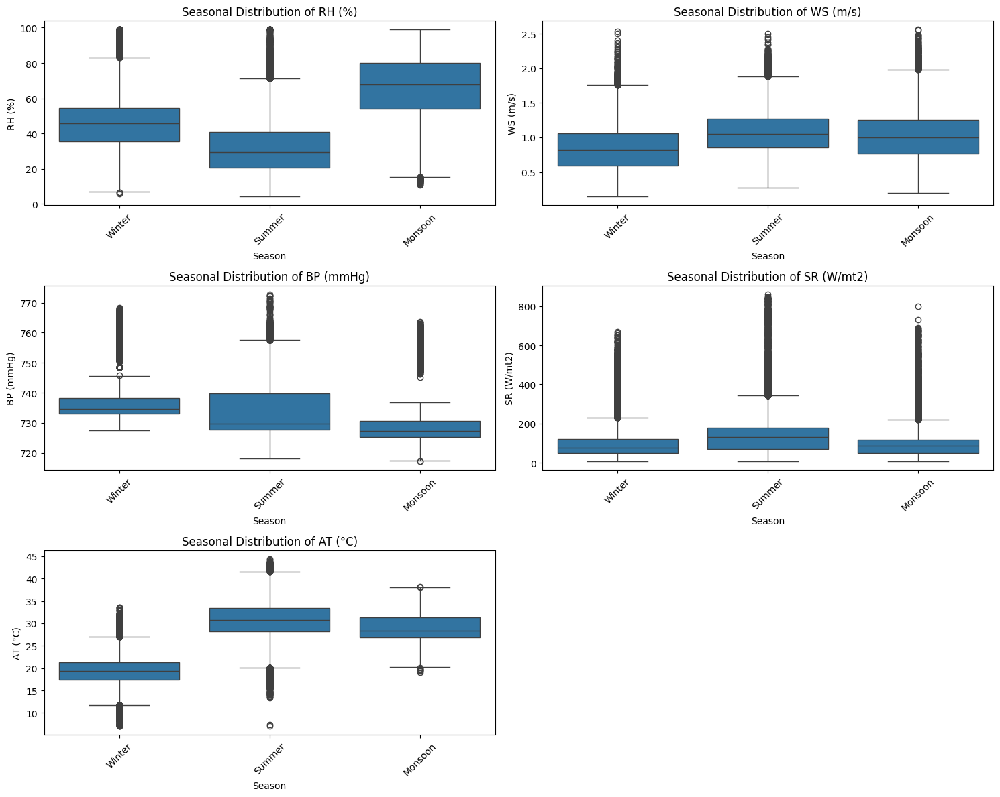

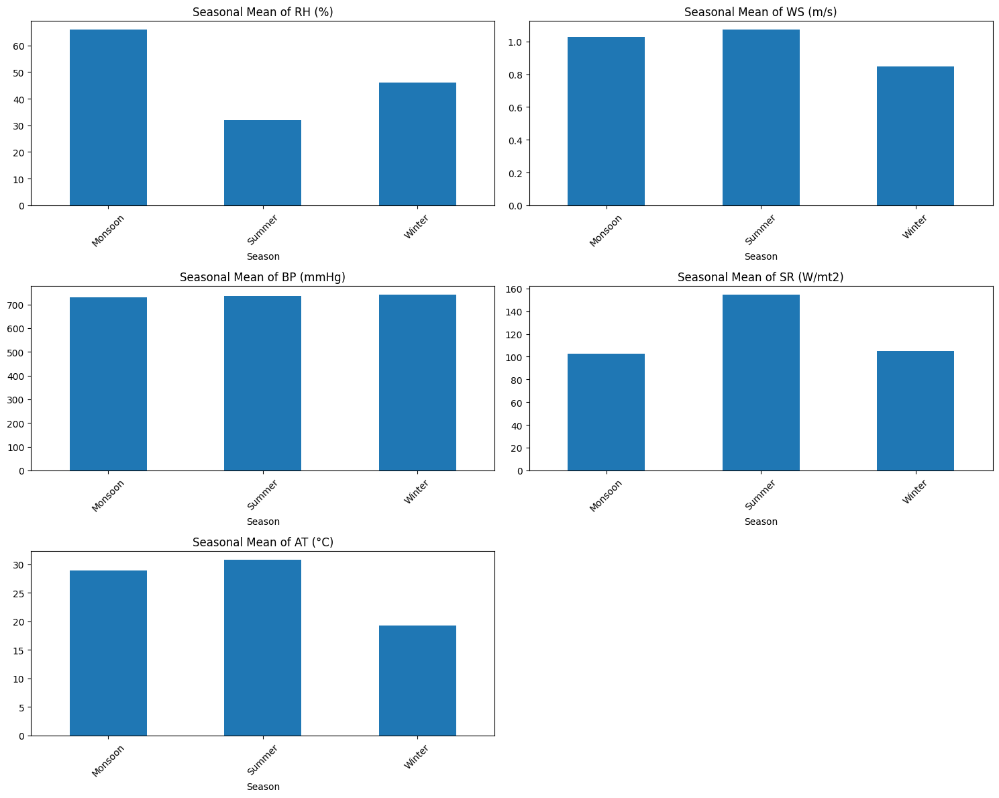

In [ ]:
weather_params = ['RH (%)', 'WS (m/s)', 'BP (mmHg)', 'SR (W/mt2)', 'AT (°C)']

# 1. First let's verify our data
print("Number of rows:", len(df))
print("\nMissing values in weather parameters:")
for param in weather_params:
    print(f"{param}: {df[param].isna().sum()} missing values")

# 2. Create clean boxplots - use a 3x2 grid instead of 2x2
plt.figure(figsize=(15, 12))
for i, param in enumerate(weather_params, 1):
    plt.subplot(3, 2, i)  # Changed to 3x2 grid to accommodate 5 parameters
    # Drop any NaN values before plotting
    plot_data = df[['Season', param]].dropna()
    sns.boxplot(x='Season', y=param, data=plot_data)
    plt.title(f'Seasonal Distribution of {param}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 3. Let's also create bar plots of seasonal means with the same 3x2 grid
plt.figure(figsize=(15, 12))
for i, param in enumerate(weather_params, 1):
    plt.subplot(3, 2, i)  # Changed to 3x2 grid
    df.groupby('Season')[param].mean().plot(kind='bar')
    plt.title(f'Seasonal Mean of {param}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Set the style for better-looking plots
plt.style.use('seaborn-v0_8-dark')
sns.set_palette("husl")

In [ ]:
# Convert Timestamp column to datetime
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

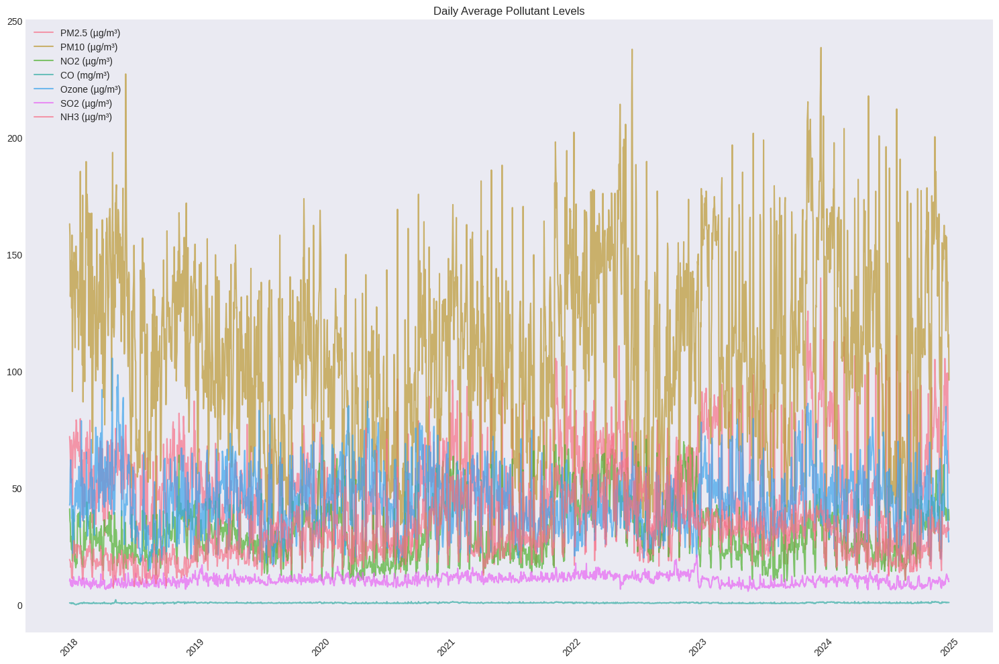

In [ ]:
plt.figure(figsize=(15, 10))
daily_avg = df.groupby([df['Timestamp'].dt.date])[key_pollutants].mean()
for pollutant in key_pollutants:
    plt.plot(daily_avg.index, daily_avg[pollutant], label=pollutant, alpha=0.7)
plt.legend()
plt.title('Daily Average Pollutant Levels')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

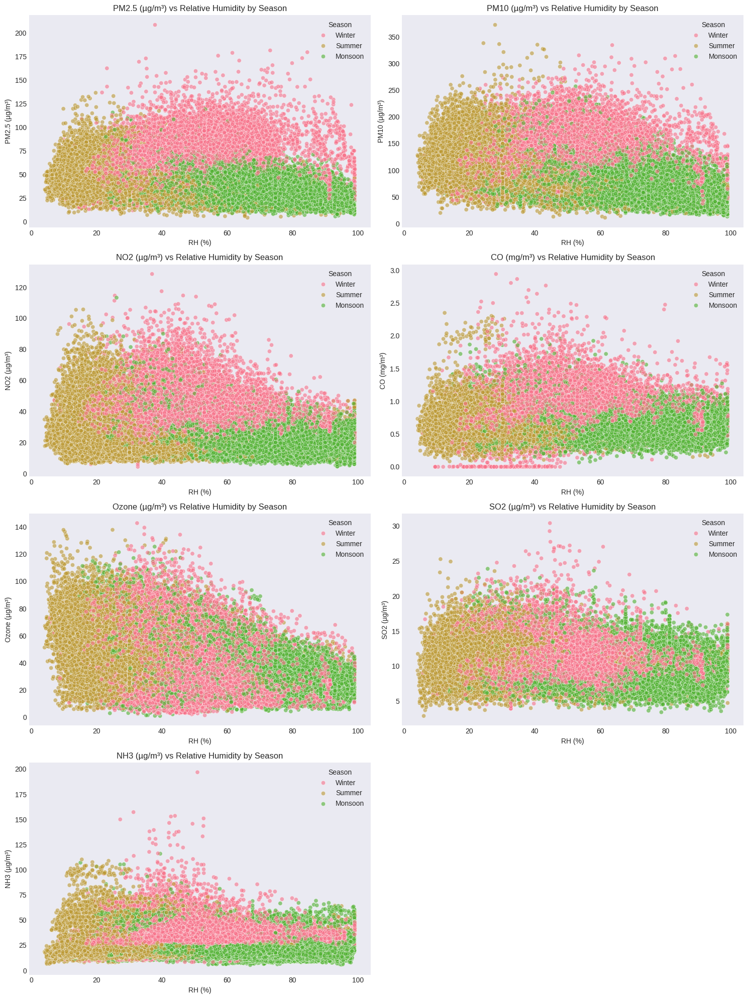

In [ ]:
# 4. Relationship between pollutants and humidity
plt.figure(figsize=(15, 20))  # Increased height further
for i, pollutant in enumerate(key_pollutants, 1):
    plt.subplot(4, 2, i)  # Changed to 4x2 grid to fit up to 8 plots
    sns.scatterplot(data=df, x='RH (%)', y=pollutant, hue='Season', alpha=0.6)
    plt.title(f'{pollutant} vs Relative Humidity by Season')
plt.tight_layout()
plt.show()

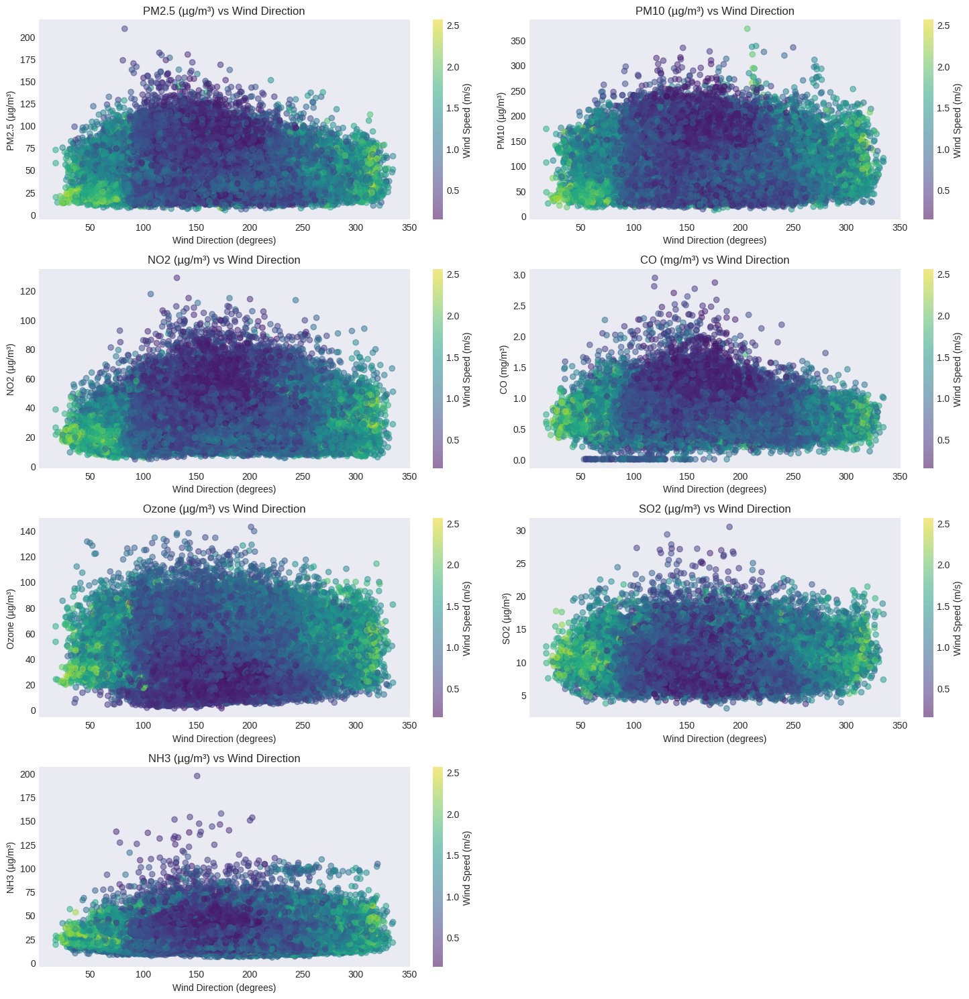

In [ ]:
# 5. Wind direction and pollutant concentration
plt.figure(figsize=(15, 15))
for i, pollutant in enumerate(key_pollutants, 1):
    plt.subplot(4, 2, i)
    plt.scatter(df['WD (deg)'], df[pollutant], alpha=0.5, c=df['WS (m/s)'], cmap='viridis')
    plt.colorbar(label='Wind Speed (m/s)')
    plt.title(f'{pollutant} vs Wind Direction')
    plt.xlabel('Wind Direction (degrees)')
    plt.ylabel(pollutant)
plt.tight_layout()
plt.show()

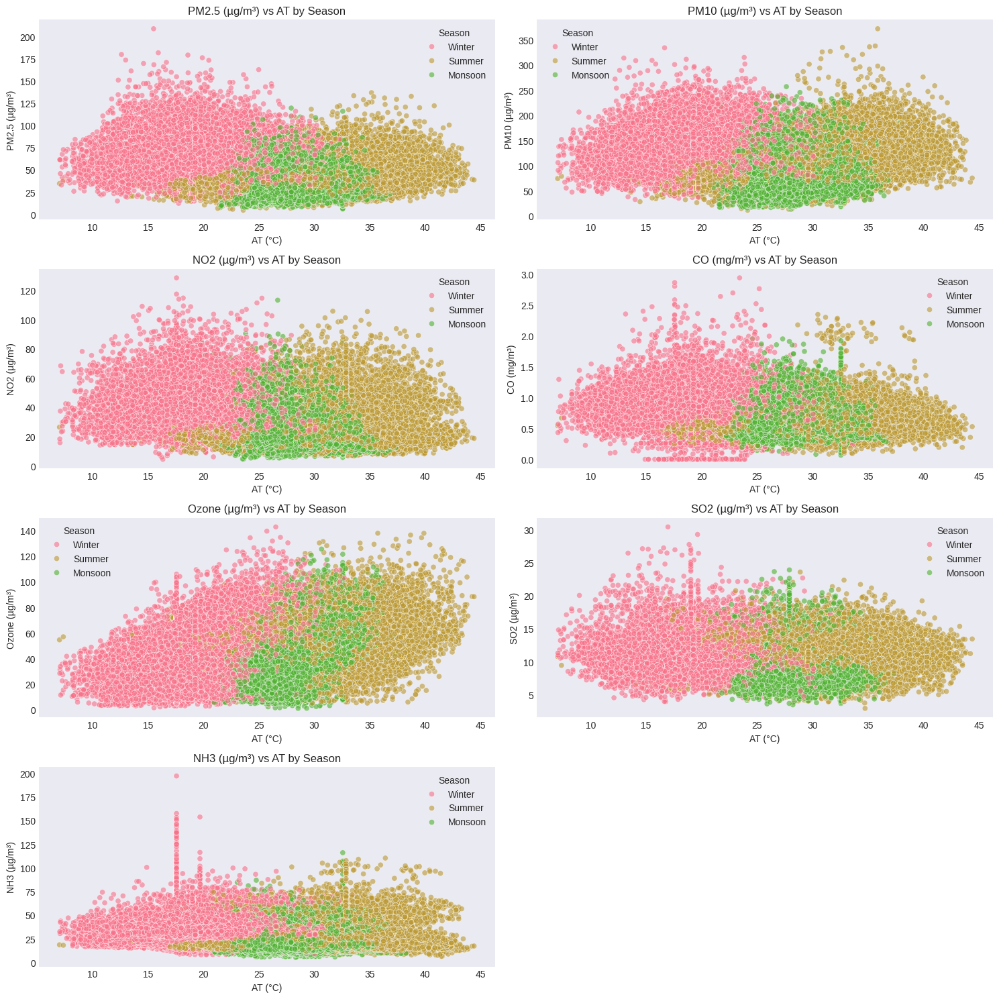

In [ ]:
# 5. Boiling Point and pollutant concentration
plt.figure(figsize=(15, 15))
for i, pollutant in enumerate(key_pollutants, 1):
    plt.subplot(4, 2, i)
    sns.scatterplot(data=df, x='AT (°C)', y=pollutant, hue='Season', alpha=0.6)
    plt.title(f'{pollutant} vs AT by Season')
plt.tight_layout()
plt.show()

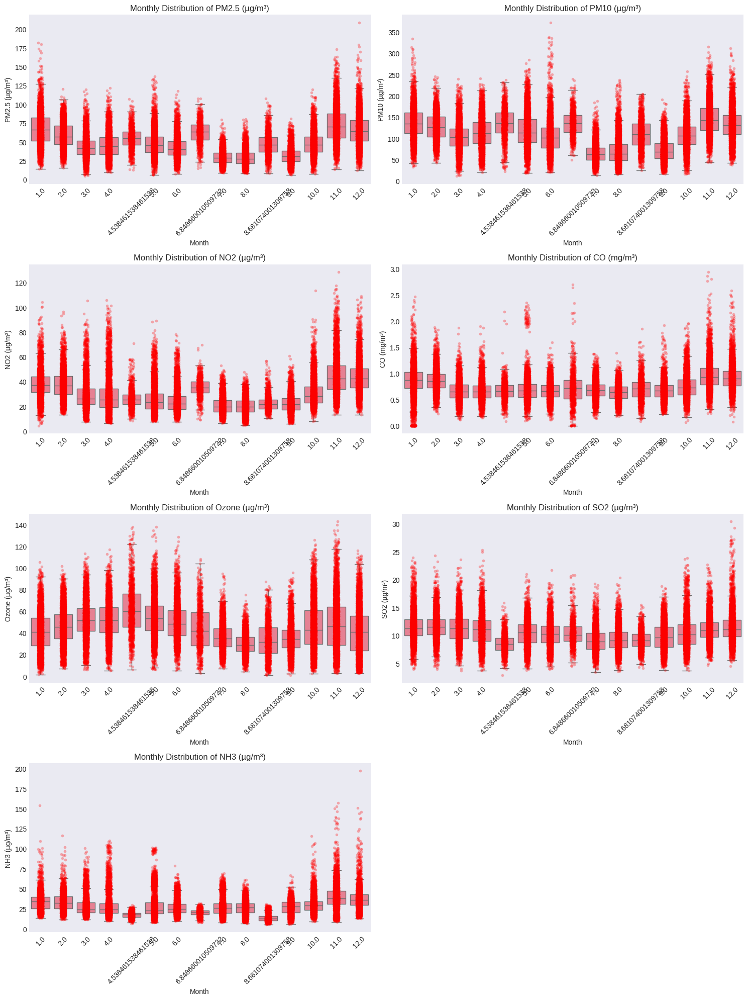

In [ ]:
# 6. Monthly box plots with points
plt.figure(figsize=(15, 20))
for i, pollutant in enumerate(key_pollutants, 1):
    plt.subplot(4, 2, i)
    sns.boxplot(data=df, x='Month', y=pollutant, showfliers=False)
    sns.stripplot(data=df, x='Month', y=pollutant, color='red', alpha=0.3, size=4)
    plt.title(f'Monthly Distribution of {pollutant}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
df_numeric = df.select_dtypes(include=["number"])

In [ ]:
corr_matrix = df_numeric.corr()

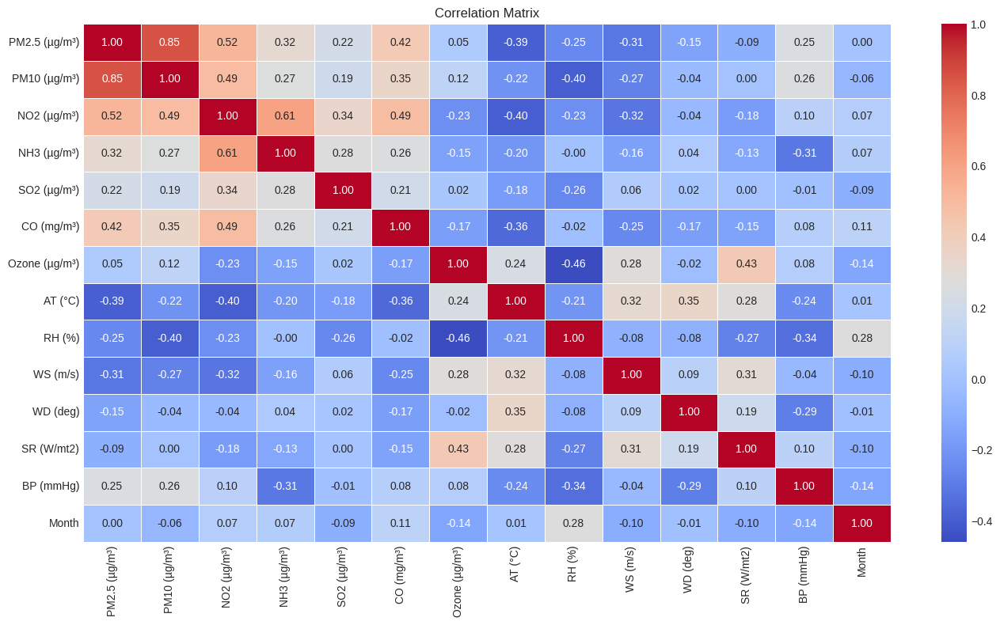

In [ ]:
plt.figure(figsize=(14, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix")
plt.tight_layout()
plt.show()

In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "merged_air_quality_data.csv"  # Update this to your file path
df = pd.read_csv(file_path)

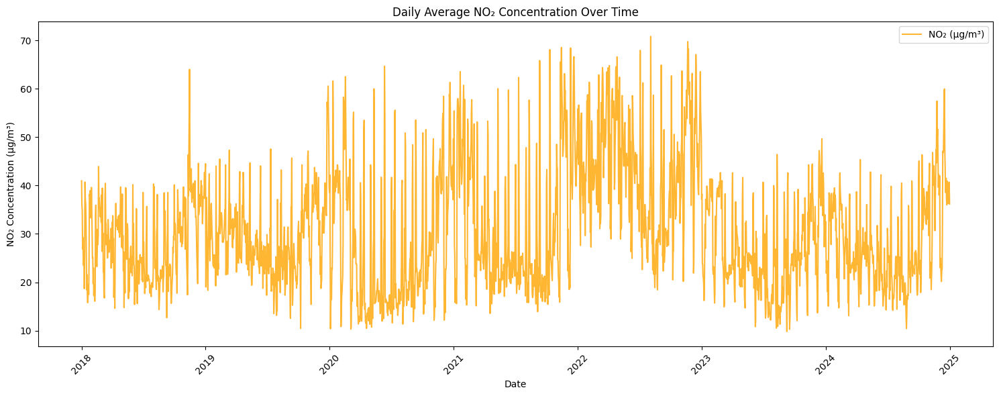

In [ ]:
# Convert Timestamp column to datetime
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

# Group by date and calculate daily average of NO2
daily_avg_no2 = df.groupby(df['Timestamp'].dt.date)['NO2 (µg/m³)'].mean()

# Plotting
plt.figure(figsize=(15, 6))
plt.plot(daily_avg_no2.index, daily_avg_no2.values, label='NO₂ (µg/m³)', color='orange', alpha=0.8)
plt.title('Daily Average NO₂ Concentration Over Time')
plt.xlabel('Date')
plt.ylabel('NO₂ Concentration (µg/m³)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


Check Which parameters used to make the model to predict what


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
# Set style for better visualizations
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("Set2")

In [ ]:
# 1. Data Loading and Preparation
# --------------------------------------------------
file_path = "merged_air_quality_data.csv"  # Update this to your file path
df = pd.read_csv(file_path, parse_dates=['Timestamp'], index_col='Timestamp')

In [ ]:
print("Date range in dataset:")
print("Start:", df.index.min())
print("End:", df.index.max())
df.index = pd.to_datetime(df.index, dayfirst=True)


Date range in dataset:
Start: 01-01-2018 00:00
End: 31-12-2024 23:00


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 61368 entries, 2018-01-01 00:00:00 to 2024-12-31 23:00:00
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PM2.5 (µg/m³)  61368 non-null  float64
 1   PM10 (µg/m³)   61368 non-null  float64
 2   NO2 (µg/m³)    61368 non-null  float64
 3   NH3 (µg/m³)    61368 non-null  float64
 4   SO2 (µg/m³)    61368 non-null  float64
 5   CO (mg/m³)     61368 non-null  float64
 6   Ozone (µg/m³)  61368 non-null  float64
 7   AT (°C)        58440 non-null  float64
 8   RH (%)         61368 non-null  float64
 9   WS (m/s)       61368 non-null  float64
 10  WD (deg)       61368 non-null  float64
 11  SR (W/mt2)     61368 non-null  float64
 12  BP (mmHg)      61368 non-null  float64
 13  Month          61368 non-null  int64  
 14  Season         61368 non-null  object 
 15  _Sources       61368 non-null  object 
 16  _SampleCount   61368 non-null  object 
dtypes: float64(13),

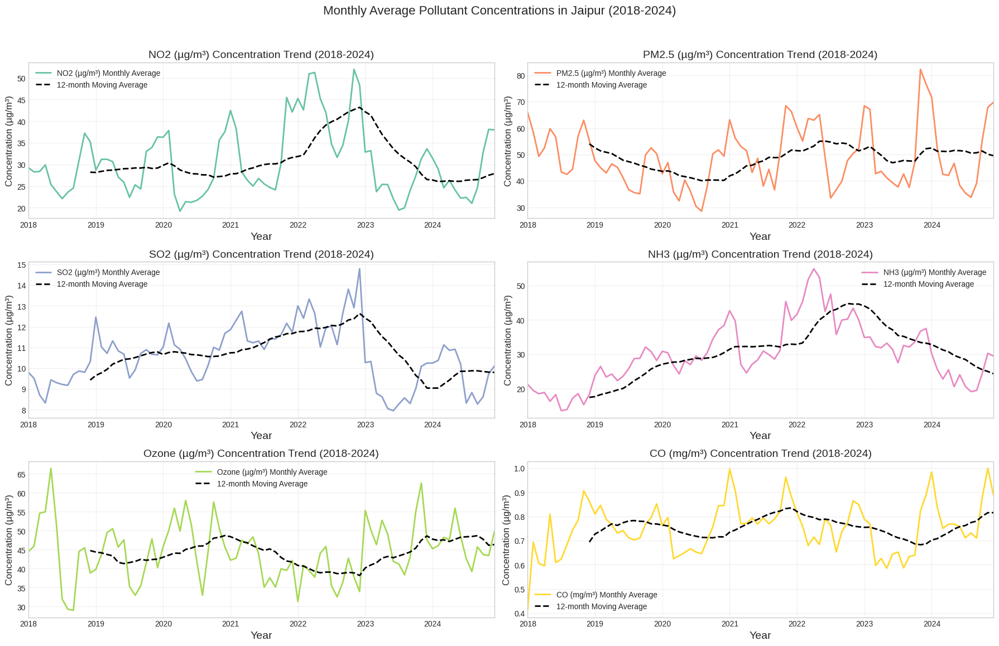

In [ ]:
# Add seasonal decomposition
df['season'] = df.index.month.map({
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Summer', 4: 'Summer', 5: 'Summer',
    6: 'Summer', 7: 'Monsoon', 8: 'Monsoon',
    9: 'Monsoon', 10: 'Monsoon', 11: 'Winter'
})

# PM2.5 (µg/m³)       0
# PM10 (µg/m³)        0
# NO2 (µg/m³)         0
# NH3 (µg/m³)         0
# SO2 (µg/m³)         0
# CO (mg/m³)          0
# Ozone (µg/m³)       0
# AT (°C)          2928
# RH (%)              0
# WS (m/s)            0
# WD (deg)            0
# SR (W/mt2)          0
# BP (mmHg)           0
# Month


# 2. Justification for NO2 Focus Plot
# --------------------------------------------------
plt.figure(figsize=(18, 15))

# Plot time series for all pollutants
pollutants = ['NO2 (µg/m³)', 'PM2.5 (µg/m³)', 'SO2 (µg/m³)', 'NH3 (µg/m³)', 'Ozone (µg/m³)', 'CO (mg/m³)']
rows, cols = 4, 2
for i, poll in enumerate(pollutants):
    plt.subplot(rows, cols, i+1)
    monthly_avg = df[poll].resample('ME').mean()
    monthly_avg.plot(label=f'{poll} Monthly Average', color=sns.color_palette("Set2")[i], lw=2)

    # Add rolling average to show trend
    rolling_avg = monthly_avg.rolling(window=12).mean()
    rolling_avg.plot(label='12-month Moving Average', color='black', lw=2, linestyle='--')

    plt.title(f'{poll} Concentration Trend (2018-2024)', fontsize=14)
    plt.ylabel('Concentration (µg/m³)', fontsize=12)
    plt.xlabel('Year', fontsize=14)
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.suptitle('Monthly Average Pollutant Concentrations in Jaipur (2018-2024)', fontsize=16, y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

<ipython-input-36-7f673164ed98>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='season', y=poll, data=df,
<ipython-input-36-7f673164ed98>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='season', y=poll, data=df,
<ipython-input-36-7f673164ed98>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='season', y=poll, data=df,
<ipython-input-36-7f673164ed98>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


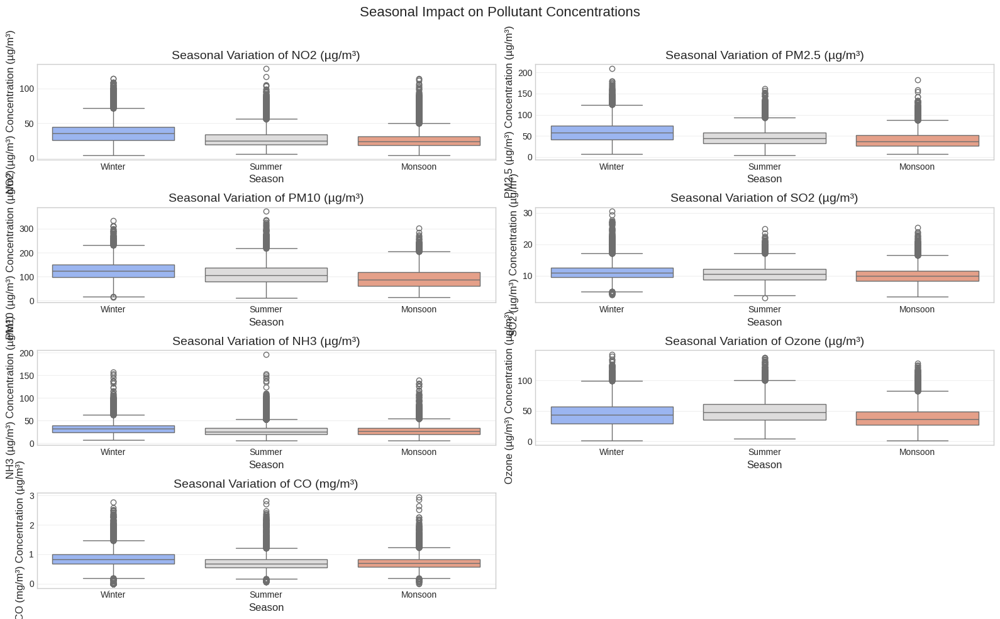

In [ ]:
# 3. Seasonal Variation of All Pollutants
# --------------------------------------------------
plt.figure(figsize=(16, 10))
rows, cols = 4, 2
for i, poll in enumerate(pollutants):
    plt.subplot(rows, cols, i+1)
    sns.boxplot(x='season', y=poll, data=df,
                order=['Winter', 'Summer', 'Monsoon'],
                palette='coolwarm')
    plt.title(f'Seasonal Variation of {poll}', fontsize=14)
    plt.xlabel('Season', fontsize=12)
    plt.ylabel(f'{poll} Concentration (µg/m³)', fontsize=12)
    plt.xticks(rotation=0)
    plt.grid(True, alpha=0.3, axis='y')

plt.suptitle('Seasonal Impact on Pollutant Concentrations', fontsize=16, y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

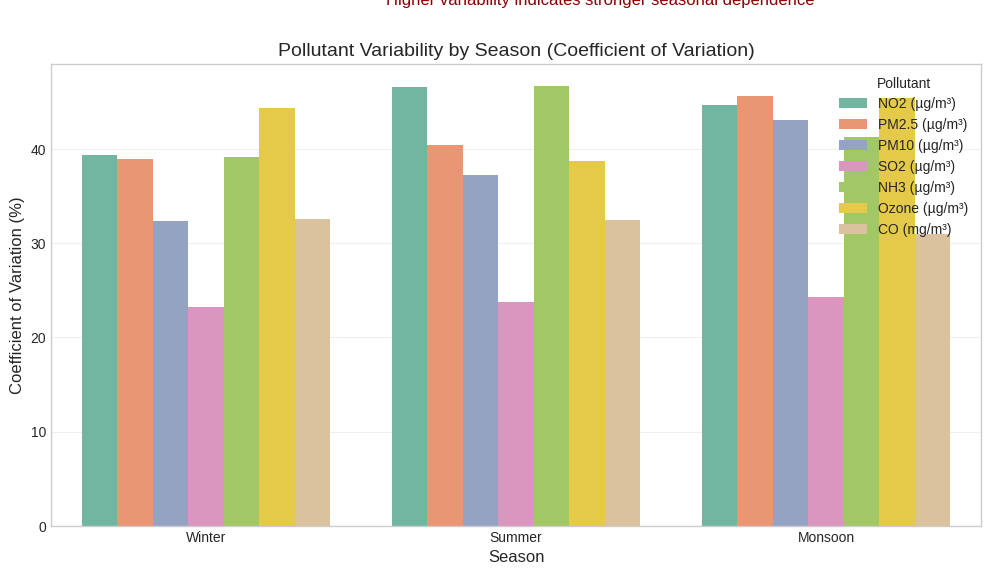

In [ ]:
# Calculate coefficient of variation to quantify variability
cv_data = []
for poll in pollutants:
    for season in ['Winter', 'Summer', 'Monsoon']:
        season_data = df[df['season'] == season][poll]
        cv = season_data.std() / season_data.mean() * 100  # Coefficient of variation
        cv_data.append({'Pollutant': poll, 'Season': season, 'CV': cv})

cv_df = pd.DataFrame(cv_data)

plt.figure(figsize=(12, 6))
sns.barplot(x='Season', y='CV', hue='Pollutant', data=cv_df,
            order=['Winter', 'Summer', 'Monsoon'],
            palette='Set2')
plt.title('Pollutant Variability by Season (Coefficient of Variation)', fontsize=14)
plt.ylabel('Coefficient of Variation (%)', fontsize=12)
plt.xlabel('Season', fontsize=12)
plt.legend(title='Pollutant')
plt.grid(True, alpha=0.3, axis='y')
plt.annotate('Higher variability indicates stronger seasonal dependence',
             xy=(0.5, 0.95), xycoords='figure fraction',
             ha='center', fontsize=12, color='darkred')
plt.show()

In [ ]:
import numpy as np

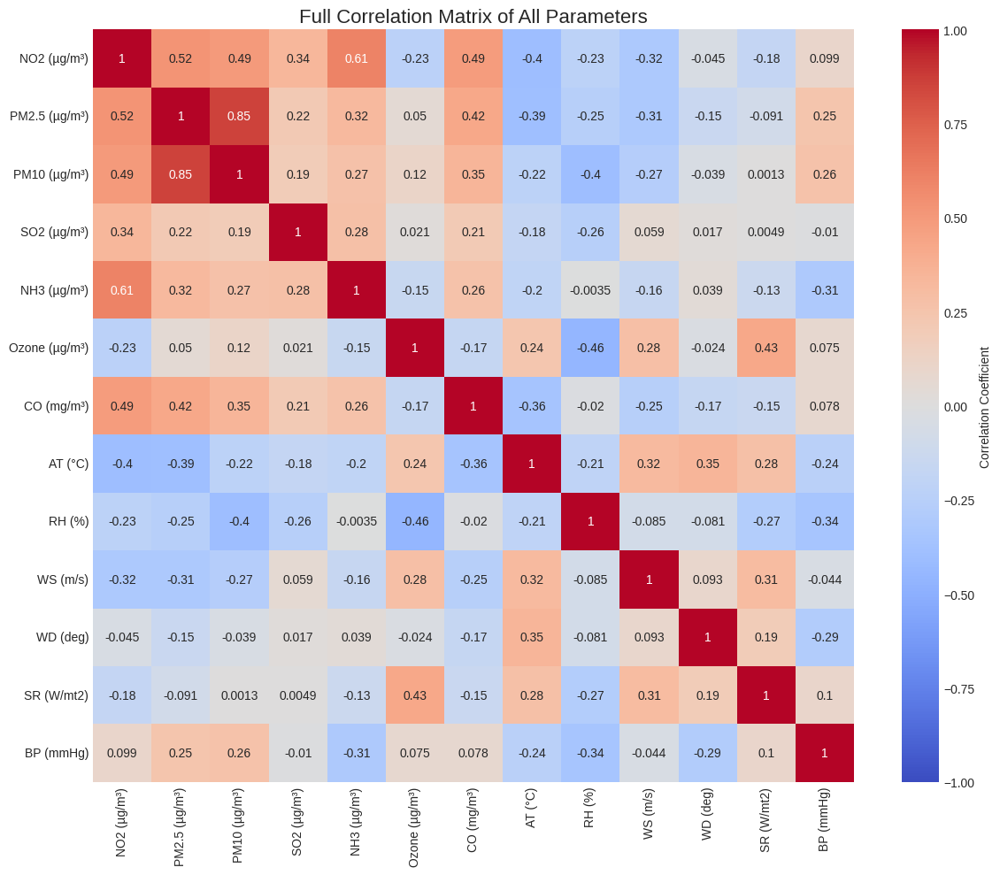

In [ ]:
# 5. Full Correlation Matrix Visualization
# --------------------------------------------------
# Select all pollutants and weather parameters
all_params = [ 'NO2 (µg/m³)','PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'SO2 (µg/m³)', 'NH3 (µg/m³)', 'Ozone (µg/m³)', 'CO (mg/m³)',
                  'AT (°C)', 'RH (%)', 'WS (m/s)', 'WD (deg)', 'SR (W/mt2)', 'BP (mmHg)']

plt.figure(figsize=(12, 10))
corr_matrix = df[all_params].corr()

# Create heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm',
            annot_kws={'size':10}, vmin=-1, vmax=1,
            cbar_kws={'label': 'Correlation Coefficient'})

plt.title('Full Correlation Matrix of All Parameters', fontsize=16)
plt.tight_layout()
plt.show()


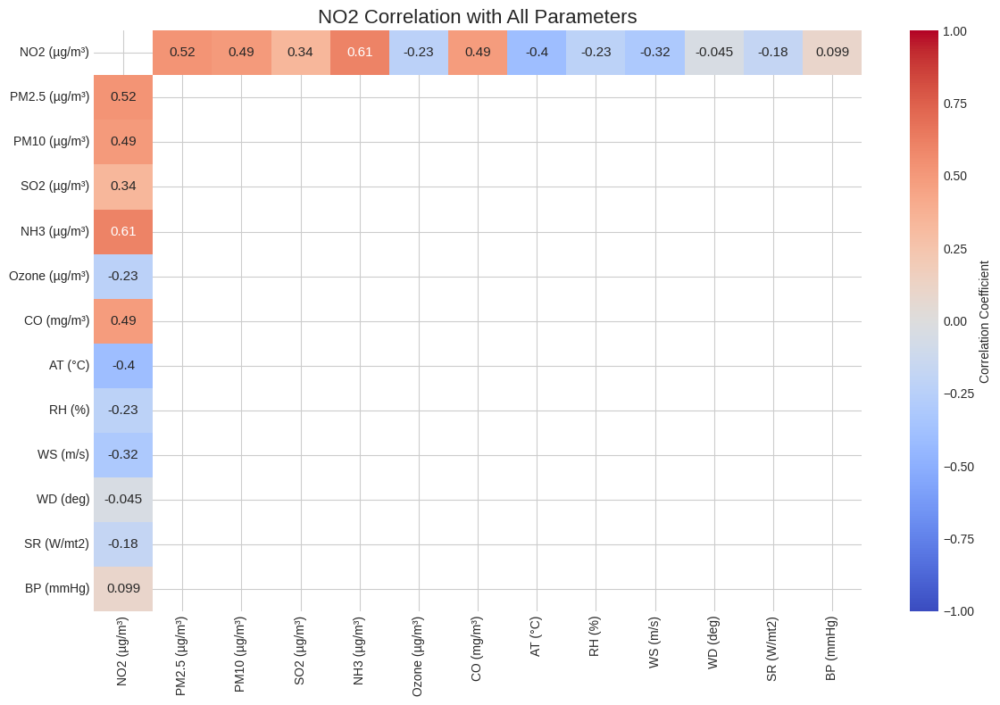

In [ ]:
# 6. NO2 Focused Correlation Matrix
# --------------------------------------------------
plt.figure(figsize=(12, 8))

# Create mask to highlight NO2 correlations
mask = np.ones_like(corr_matrix, dtype=bool)
mask[0,:] = False  # Show only NO2 row
mask[:,0] = False  # Show only NO2 column
mask[np.diag_indices_from(mask)] = True  # Hide diagonal (self-correlation)

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', mask=mask,
            annot_kws={'size':11}, vmin=-1, vmax=1,
            cbar_kws={'label': 'Correlation Coefficient'})

plt.title('NO2 Correlation with All Parameters', fontsize=16)
plt.tight_layout()
plt.show()


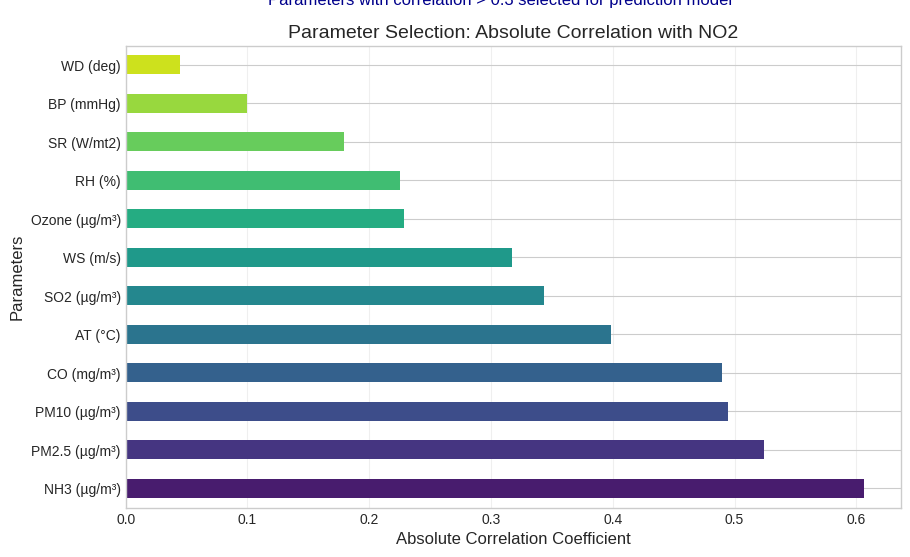

In [ ]:
# 7. Parameter Selection Justification
# --------------------------------------------------
plt.figure(figsize=(10, 6))

# Get absolute correlations with NO2
no2_correlations = corr_matrix['NO2 (µg/m³)'].abs().sort_values(ascending=False)[1:]

# Plot horizontal bar chart
ax = no2_correlations.plot(kind='barh', color=sns.color_palette("viridis", len(no2_correlations)))
plt.title('Parameter Selection: Absolute Correlation with NO2', fontsize=14)
plt.xlabel('Absolute Correlation Coefficient', fontsize=12)
plt.ylabel('Parameters', fontsize=12)
plt.grid(axis='x', alpha=0.3)


plt.annotate('Parameters with correlation > 0.3 selected for prediction model',
             xy=(0.5, 0.92), xycoords='figure fraction',
             ha='center', fontsize=12, color='darkblue')
plt.show()

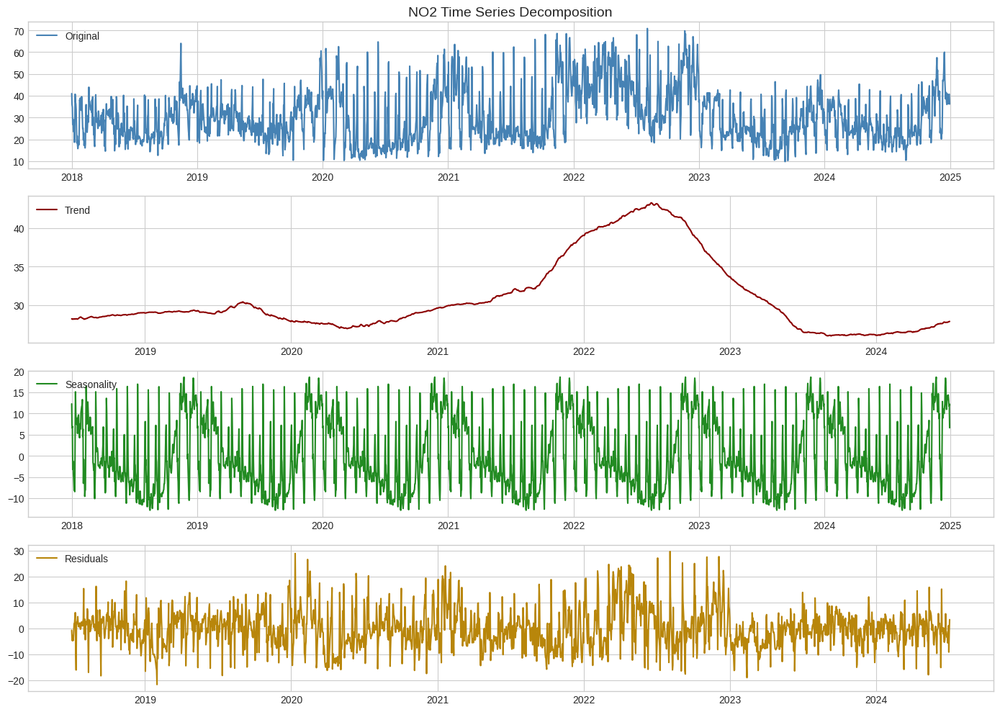

In [ ]:
# 8. Time Series Decomposition for NO2
# --------------------------------------------------
# Resample to daily frequency and fill gaps
daily_no2 = df['NO2 (µg/m³)'].resample('D').mean().interpolate()

# Perform seasonal decomposition
result = seasonal_decompose(daily_no2, model='additive', period=365)

plt.figure(figsize=(14, 10))
plt.subplot(411)
plt.plot(daily_no2, label='Original', color='steelblue')
plt.legend(loc='upper left')
plt.title('NO2 Time Series Decomposition', fontsize=14)

plt.subplot(412)
plt.plot(result.trend, label='Trend', color='darkred')
plt.legend(loc='upper left')

plt.subplot(413)
plt.plot(result.seasonal, label='Seasonality', color='forestgreen')
plt.legend(loc='upper left')

plt.subplot(414)
plt.plot(result.resid, label='Residuals', color='darkgoldenrod')
plt.legend(loc='upper left')

plt.tight_layout()
plt.savefig('no2_decomposition.png', dpi=300, bbox_inches='tight')
plt.show()


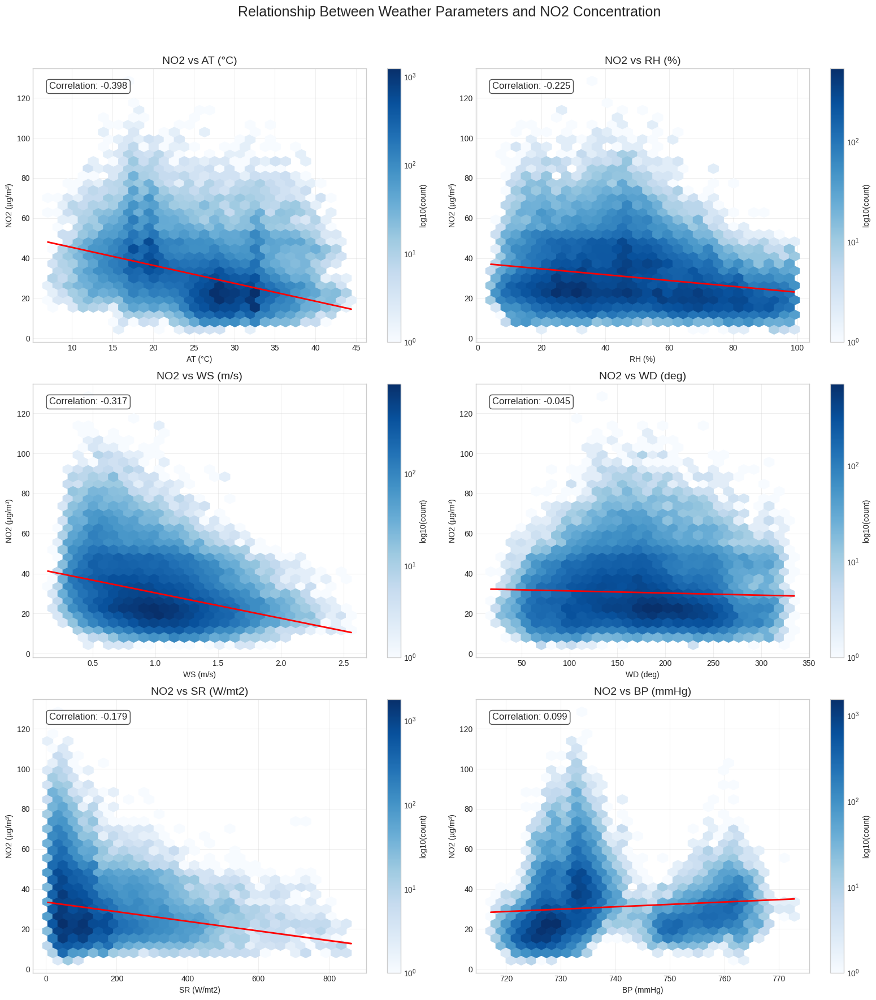

In [ ]:
# 9. Weather Parameters and NO2 Relationship
# --------------------------------------------------
weather_params = ['AT (°C)', 'RH (%)', 'WS (m/s)', 'WD (deg)', 'SR (W/mt2)', 'BP (mmHg)']
fig, axes = plt.subplots(3, 2, figsize=(16, 18))  # 3 rows, 2 cols for 6 parameters

for i, param in enumerate(weather_params):
    row, col = i // 2, i % 2

    ax = axes[row, col]

    # Method 1: Use hexbin instead of scatter for dense data visualization
    hb = ax.hexbin(df[param], df['NO2 (µg/m³)'], gridsize=30, cmap='Blues',
                  mincnt=1, bins='log')

    # Add regression line with confidence interval
    sns.regplot(x=param, y='NO2 (µg/m³)', data=df, scatter=False,
                line_kws={'color':'red', 'linewidth':2}, ax=ax)

    # Add colorbar
    cb = plt.colorbar(hb, ax=ax)
    cb.set_label('log10(count)')

    # Method 2 (alternative): Binned mean with standard deviation
    # Uncomment these lines if you prefer this approach
    '''
    # Create binned averages
    bins = np.linspace(df[param].min(), df[param].max(), 15)
    groups = df.groupby(pd.cut(df[param], bins))
    bin_means = groups['NO2 (µg/m³)'].mean()
    bin_std = groups['NO2 (µg/m³)'].std()
    bin_centers = [(bins[i] + bins[i+1])/2 for i in range(len(bins)-1)]

    # Plot original data with low alpha
    ax.scatter(df[param], df['NO2 (µg/m³)'], alpha=0.05, s=5, color='blue')

    # Plot binned means with error bars
    ax.errorbar(bin_centers, bin_means, yerr=bin_std, fmt='o-', color='red',
                linewidth=2, markersize=6, capsize=4)
    '''

    # Calculate and display correlation
    corr = df[[param, 'NO2 (µg/m³)']].corr().iloc[0,1]
    ax.text(0.05, 0.95, f'Correlation: {corr:.3f}', transform=ax.transAxes,
            fontsize=12, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    ax.set_title(f'NO2 vs {param}', fontsize=14)
    ax.grid(True, alpha=0.3)

plt.suptitle('Relationship Between Weather Parameters and NO2 Concentration', fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

<ipython-input-51-fcc227ac0188>:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg.index = pd.date_range(start='2023-01-01', periods=12, freq='M').month_name()


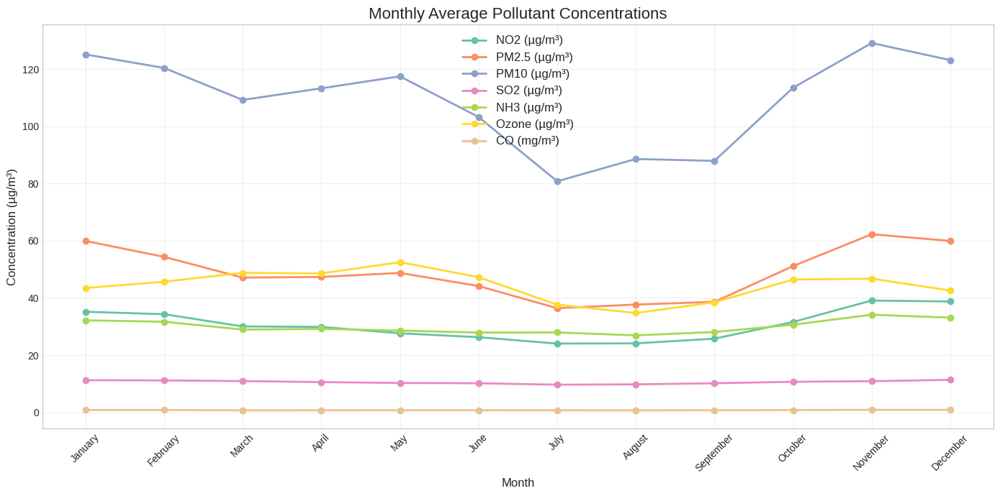

In [ ]:
# 10. Monthly Average Patterns
# --------------------------------------------------
# Compute monthly averages across years
monthly_avg = df.groupby(df.index.month)[pollutants].mean()
monthly_avg.index = pd.date_range(start='2023-01-01', periods=12, freq='M').month_name()

plt.figure(figsize=(14, 7))
for i, poll in enumerate(pollutants):
    plt.plot(monthly_avg.index, monthly_avg[poll], marker='o', linewidth=2,
             label=poll, color=sns.color_palette("Set2")[i])

plt.title('Monthly Average Pollutant Concentrations', fontsize=16)
plt.ylabel('Concentration (µg/m³)', fontsize=12)
plt.xlabel('Month', fontsize=12)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

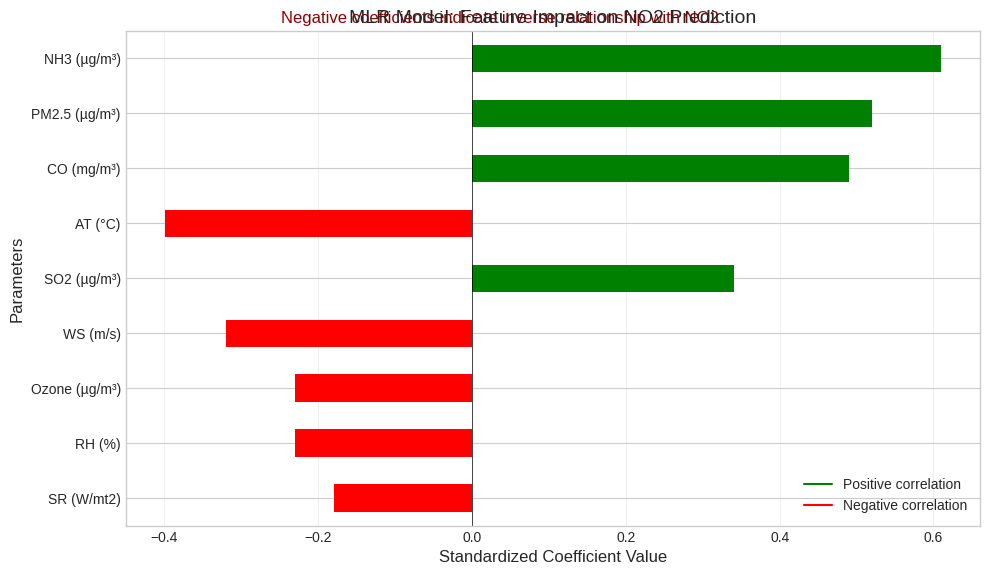

All visualizations complete!


In [ ]:
# 11. Final Model Parameters Visualization
# --------------------------------------------------
# Sample model coefficients - replace with your actual model coefficients
mlr_coefficients = pd.Series({
    'PM2.5 (µg/m³)': 0.52,
    'AT (°C)': -0.4,
    'RH (%)': -0.23,
    'WS (m/s)': -0.32,
    'SR (W/mt2)': -0.18,
    'CO (mg/m³)': 0.49,
    'NH3 (µg/m³)': 0.61,
    'Ozone (µg/m³)': -0.23,
    'SO2 (µg/m³)': 0.34,
})

plt.figure(figsize=(10, 6))
# Sort by absolute values but keep sign for plotting
sorted_coeffs = mlr_coefficients.reindex(mlr_coefficients.abs().sort_values().index)

colors = ['red' if x < 0 else 'green' for x in sorted_coeffs]
sorted_coeffs.plot(kind='barh', color=colors)

plt.title('MLR Model: Feature Impact on NO2 Prediction', fontsize=14)
plt.xlabel('Standardized Coefficient Value', fontsize=12)
plt.ylabel('Parameters', fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)

# Add legend for coefficient interpretation
plt.plot([], [], color='green', label='Positive correlation')
plt.plot([], [], color='red', label='Negative correlation')
plt.legend(loc='lower right')

plt.annotate('Negative coefficients indicate inverse relationship with NO2',
             xy=(0.5, 0.92), xycoords='figure fraction',
             ha='center', fontsize=12, color='darkred')
plt.tight_layout()
plt.savefig('model_coefficients.png', dpi=300, bbox_inches='tight')
plt.show()

print("All visualizations complete!")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_regression
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Assuming df is your original dataframe with timestamp index
# Create a copy for processing
df_processed = df.copy()

print("\nCreating enhanced features...")
# Enhanced time features
df_processed['hour'] = df_processed.index.hour
df_processed['day_of_week'] = df_processed.index.dayofweek
df_processed['month'] = df_processed.index.month
df_processed['day_of_year'] = df_processed.index.dayofyear
df_processed['is_weekend'] = (df_processed.index.dayofweek >= 5).astype(int)
df_processed['is_business_hours'] = ((df_processed['hour'] >= 8) & (df_processed['hour'] <= 18) &
                                    (df_processed['is_weekend'] == 0)).astype(int)
df_processed['is_rush_hour_am'] = ((df_processed['hour'] >= 7) & (df_processed['hour'] <= 9)).astype(int)
df_processed['is_rush_hour_pm'] = ((df_processed['hour'] >= 16) & (df_processed['hour'] <= 19)).astype(int)

# Cyclical encoding
df_processed['hour_sin'] = np.sin(2 * np.pi * df_processed['hour']/24)
df_processed['hour_cos'] = np.cos(2 * np.pi * df_processed['hour']/24)
df_processed['day_sin'] = np.sin(2 * np.pi * df_processed['day_of_week']/7)
df_processed['day_cos'] = np.cos(2 * np.pi * df_processed['day_of_week']/7)
df_processed['month_sin'] = np.sin(2 * np.pi * df_processed['month']/12)
df_processed['month_cos'] = np.cos(2 * np.pi * df_processed['month']/12)

# Set target column
target_col = 'NO2 (µg/m³)'

# Enhanced lag features (with more carefully selected lags)
important_lags = [1, 2, 3, 23, 24, 25, 48, 168]  # 1hr, 2hr, 3hr, previous hour yesterday, etc.
for lag in important_lags:
    df_processed[f'{target_col}_lag_{lag}'] = df_processed[target_col].shift(lag)

# Add rolling window features (with smaller windows to avoid leakage)
for window in [3, 6, 12, 24]:
    df_processed[f'{target_col}_rolling_mean_{window}'] = df_processed[target_col].rolling(window=window).mean()
    df_processed[f'{target_col}_rolling_std_{window}'] = df_processed[target_col].rolling(window=window).std()

# Drop rows with NaN values
df_processed = df_processed.dropna()


Creating enhanced features...


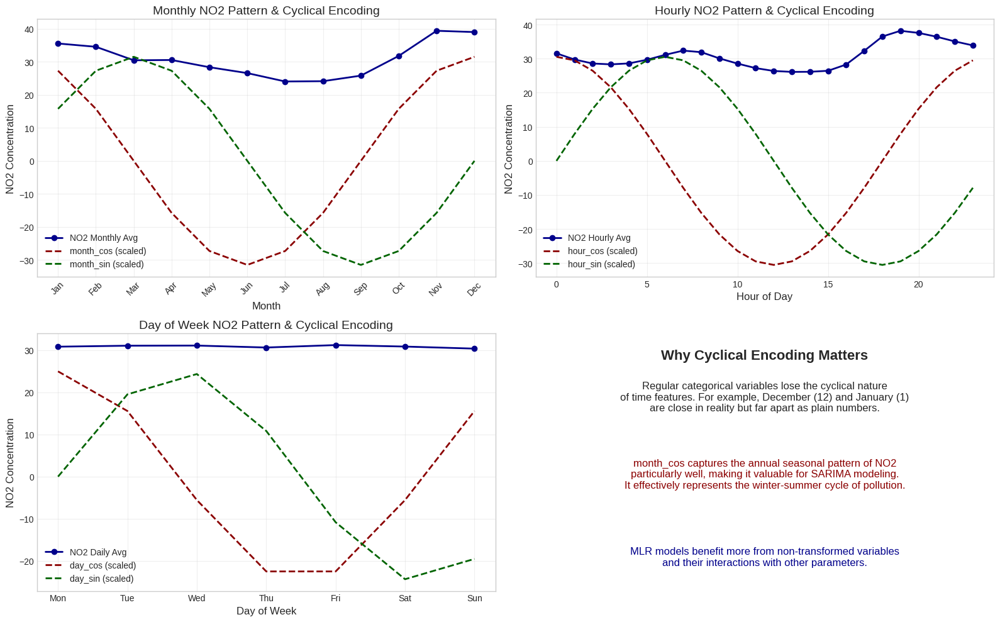

In [ ]:

# 1. Visualize Cyclical Features
# --------------------------------------------------
plt.figure(figsize=(16, 10))

# Plot month_sin and month_cos with NO2
plt.subplot(2, 2, 1)
monthly_no2 = df_processed.groupby('month')[target_col].mean()
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.plot(month_names, monthly_no2.values, 'o-', color='darkblue', linewidth=2, label='NO2 Monthly Avg')
plt.plot(month_names, df_processed.groupby('month')['month_cos'].mean().values * monthly_no2.max() * 0.8,
         '--', color='darkred', linewidth=2, label='month_cos (scaled)')
plt.plot(month_names, df_processed.groupby('month')['month_sin'].mean().values * monthly_no2.max() * 0.8,
         '--', color='darkgreen', linewidth=2, label='month_sin (scaled)')
plt.title('Monthly NO2 Pattern & Cyclical Encoding', fontsize=14)
plt.xlabel('Month', fontsize=12)
plt.ylabel('NO2 Concentration', fontsize=12)
plt.xticks(rotation=45)
plt.legend()
plt.grid(True, alpha=0.3)

# Plot hour_sin and hour_cos with NO2
plt.subplot(2, 2, 2)
hourly_no2 = df_processed.groupby('hour')[target_col].mean()
plt.plot(hourly_no2.index, hourly_no2.values, 'o-', color='darkblue', linewidth=2, label='NO2 Hourly Avg')
plt.plot(hourly_no2.index, df_processed.groupby('hour')['hour_cos'].mean().values * hourly_no2.max() * 0.8,
         '--', color='darkred', linewidth=2, label='hour_cos (scaled)')
plt.plot(hourly_no2.index, df_processed.groupby('hour')['hour_sin'].mean().values * hourly_no2.max() * 0.8,
         '--', color='darkgreen', linewidth=2, label='hour_sin (scaled)')
plt.title('Hourly NO2 Pattern & Cyclical Encoding', fontsize=14)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('NO2 Concentration', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Plot day_sin and day_cos with NO2
plt.subplot(2, 2, 3)
daily_no2 = df_processed.groupby('day_of_week')[target_col].mean()
day_names = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
plt.plot(day_names, daily_no2.values, 'o-', color='darkblue', linewidth=2, label='NO2 Daily Avg')
plt.plot(day_names, df_processed.groupby('day_of_week')['day_cos'].mean().values * daily_no2.max() * 0.8,
         '--', color='darkred', linewidth=2, label='day_cos (scaled)')
plt.plot(day_names, df_processed.groupby('day_of_week')['day_sin'].mean().values * daily_no2.max() * 0.8,
         '--', color='darkgreen', linewidth=2, label='day_sin (scaled)')
plt.title('Day of Week NO2 Pattern & Cyclical Encoding', fontsize=14)
plt.xlabel('Day of Week', fontsize=12)
plt.ylabel('NO2 Concentration', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Add annotation to explain the importance of cyclical encoding
plt.subplot(2, 2, 4)
plt.axis('off')
plt.text(0.5, 0.9, 'Why Cyclical Encoding Matters', fontsize=16, ha='center', weight='bold')
plt.text(0.5, 0.7, 'Regular categorical variables lose the cyclical nature\n'
                   'of time features. For example, December (12) and January (1)\n'
                   'are close in reality but far apart as plain numbers.',
         fontsize=12, ha='center')
plt.text(0.5, 0.4, 'month_cos captures the annual seasonal pattern of NO2\n'
                   'particularly well, making it valuable for SARIMA modeling.\n'
                   'It effectively represents the winter-summer cycle of pollution.',
         fontsize=12, ha='center', color='darkred')
plt.text(0.5, 0.1, 'MLR models benefit more from non-transformed variables\n'
                   'and their interactions with other parameters.',
         fontsize=12, ha='center', color='darkblue')

plt.tight_layout()

plt.show()

In [ ]:
from sklearn.feature_selection import SelectKBest, f_regression

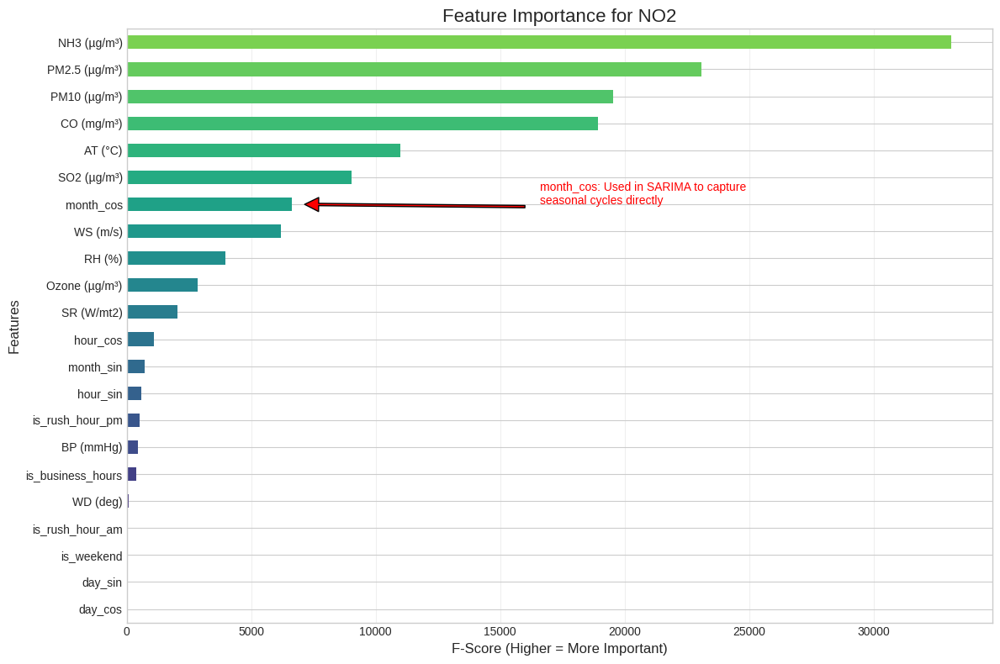

In [ ]:
# 2. Feature Importance for MLR
# --------------------------------------------------
# Select relevant features for MLR
mlr_features = ['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'SO2 (µg/m³)', 'NH3 (µg/m³)', 'Ozone (µg/m³)', 'CO (mg/m³)',
                  'AT (°C)', 'RH (%)', 'WS (m/s)', 'WD (deg)', 'SR (W/mt2)', 'BP (mmHg)',
               'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos',
               'is_weekend', 'is_business_hours', 'is_rush_hour_am', 'is_rush_hour_pm']

# Prepare X and y for feature selection
X = df_processed[mlr_features]
y = df_processed[target_col]

# Feature selection using ANOVA F-value
selector = SelectKBest(score_func=f_regression, k='all')
selector.fit(X, y)
scores = pd.Series(selector.scores_, index=X.columns)

plt.figure(figsize=(12, 8))
scores.sort_values(ascending=True).plot(kind='barh', color=plt.cm.viridis(np.linspace(0, 0.8, len(scores))))
plt.title('Feature Importance for NO2', fontsize=16)
plt.xlabel('F-Score (Higher = More Important)', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.grid(True, alpha=0.3, axis='x')

# Highlight month_cos and month_sin
month_cos_idx = scores.sort_values().index.get_loc('month_cos')
month_sin_idx = np.where(scores.index == 'month_sin')[0][0]
plt.annotate('month_cos: Used in SARIMA to capture\nseasonal cycles directly',
             xy=(scores['month_cos'], month_cos_idx),
             xytext=(scores['month_cos'] + scores.max()*0.3, month_cos_idx),
             arrowprops=dict(facecolor='red', shrink=0.05, width=2),
             fontsize=10, color='red')

plt.tight_layout()
plt.show()


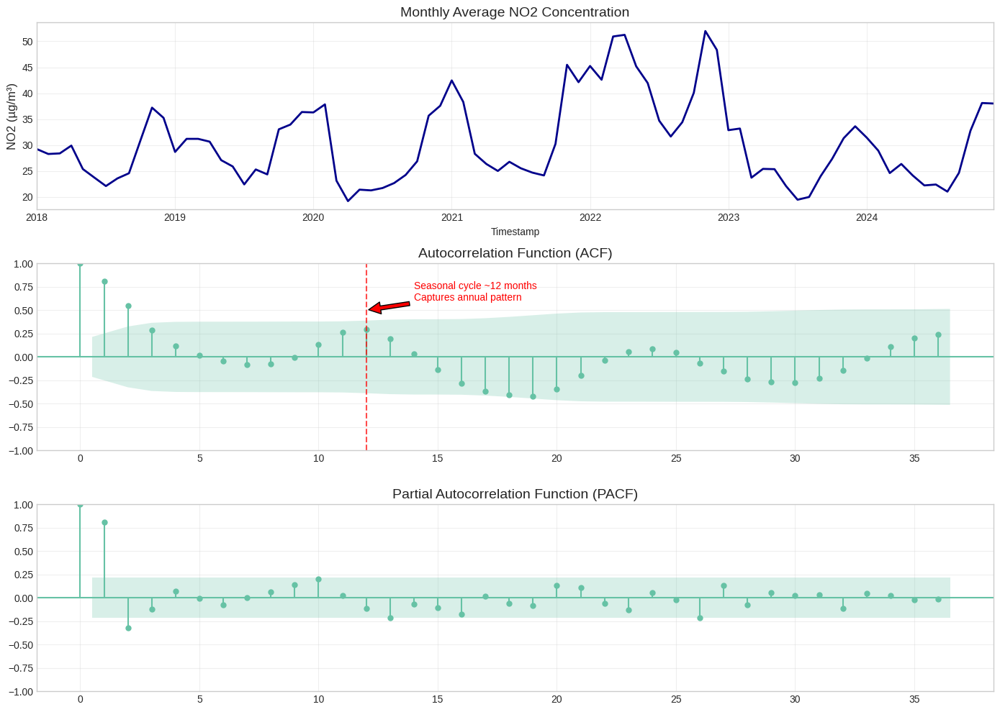

In [ ]:
# 3. Autocorrelation and Seasonal Components (SARIMA Justification)
# --------------------------------------------------
plt.figure(figsize=(14, 10))

# Monthly average NO2 values
monthly_data = df[target_col].resample('ME').mean()

# Plot the time series
plt.subplot(3, 1, 1)
monthly_data.plot(linewidth=2, color='darkblue')
plt.title('Monthly Average NO2 Concentration', fontsize=14)
plt.ylabel('NO2 (µg/m³)', fontsize=12)
plt.grid(True, alpha=0.3)

# Plot ACF
plt.subplot(3, 1, 2)
plot_acf(monthly_data.dropna(), lags=36, ax=plt.gca())
plt.title('Autocorrelation Function (ACF)', fontsize=14)
plt.grid(True, alpha=0.3)

# Highlight the seasonal component (around 12 months)
plt.axvline(x=12, color='red', linestyle='--', alpha=0.7)
plt.annotate('Seasonal cycle ~12 months\nCaptures annual pattern',
             xy=(12, 0.5),
             xytext=(14, 0.6),
             arrowprops=dict(facecolor='red', shrink=0.05),
             fontsize=10, color='red')

# Plot PACF
plt.subplot(3, 1, 3)
plot_pacf(monthly_data.dropna(), lags=36, ax=plt.gca())
plt.title('Partial Autocorrelation Function (PACF)', fontsize=14)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


    month  month_cos_corr  temp_corr
0       1   -1.516173e-16  -0.286682
1       2             NaN  -0.340381
2       3             NaN  -0.054765
3       4   -2.019459e-16  -0.051289
4       5   -7.704144e-18  -0.208922
5       6             NaN  -0.304307
6       7    2.203924e-16  -0.390820
7       8    5.687434e-17  -0.357513
8       9             NaN  -0.322606
9      10             NaN  -0.353752
10     11    1.086619e-16  -0.439135
11     12             NaN  -0.475271


/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


<Figure size 1200x600 with 0 Axes>

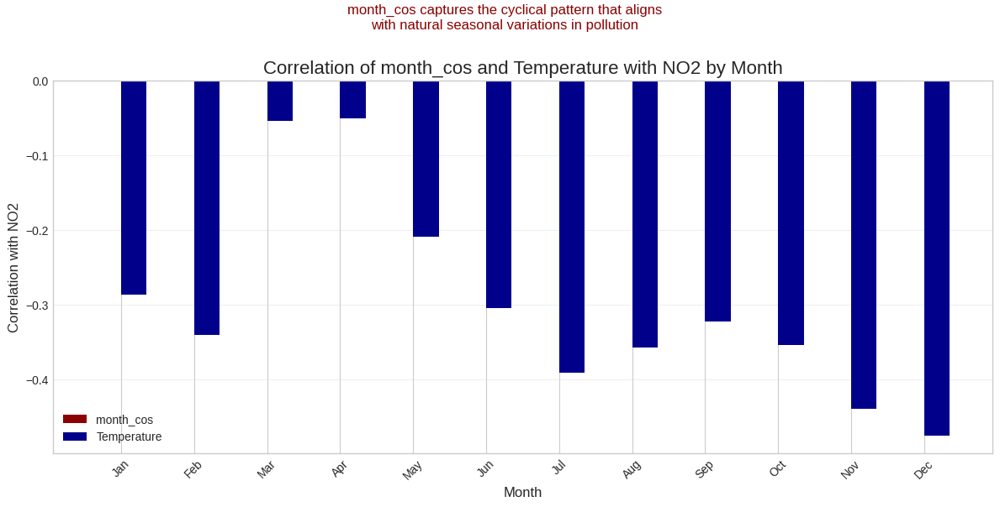

In [ ]:
# 4. Compare month_cos with direct month variable
# --------------------------------------------------
plt.figure(figsize=(12, 6))

# Correlation with NO2 by month - corrected approach
correlations = []

# Loop through each month
for month in range(1, 13):
    # Filter data for this month
    month_data = df_processed[df_processed['month'] == month]

    # Calculate correlations if we have enough data
    if len(month_data) > 10:  # Ensure we have enough data points
        corr_month_cos = np.corrcoef(month_data['month_cos'], month_data[target_col])[0,1]
        corr_temp = np.corrcoef(month_data['AT (°C)'], month_data[target_col])[0,1]
    else:
        corr_month_cos = np.nan
        corr_temp = np.nan

    correlations.append({
        'month': month,
        'month_cos_corr': corr_month_cos,
        'temp_corr': corr_temp
    })

# Convert to DataFrame
corr_df = pd.DataFrame(correlations)

# Plot the correlations
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
x = np.arange(len(month_names))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 6))
bar1 = ax.bar(x - width/2, corr_df['month_cos_corr'], width, label='month_cos', color='darkred')
bar2 = ax.bar(x + width/2, corr_df['temp_corr'], width, label='Temperature', color='darkblue')

ax.set_title('Correlation of month_cos and Temperature with NO2 by Month', fontsize=16)
ax.set_xlabel('Month', fontsize=12)
ax.set_ylabel('Correlation with NO2', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(month_names, rotation=45)
ax.legend()
ax.grid(True, alpha=0.3, axis='y')
print(corr_df)


# Add annotation to explain why month_cos is better for SARIMA
plt.annotate('month_cos captures the cyclical pattern that aligns\nwith natural seasonal variations in pollution',
             xy=(0.5, 0.95), xycoords='figure fraction',
             ha='center', fontsize=12, color='darkred')

plt.tight_layout()
plt.show()

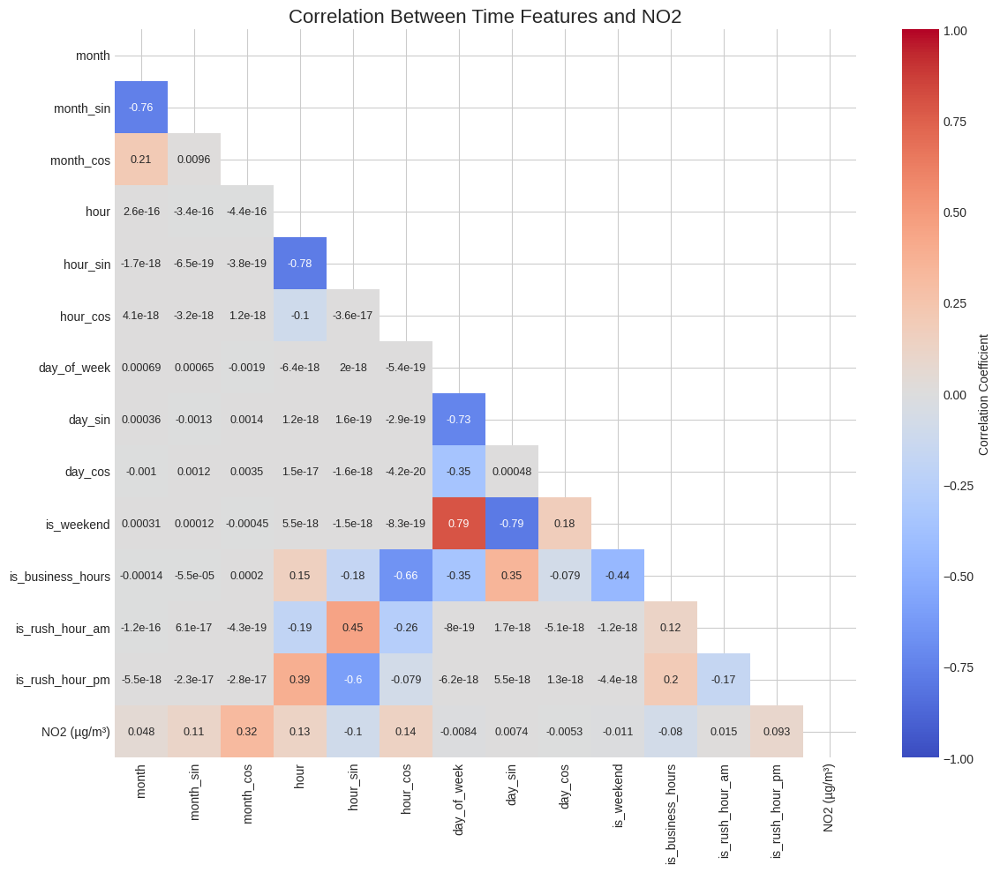

Feature engineering analysis completed!


In [ ]:
# 5. Time Series Features Correlation Heatmap
# --------------------------------------------------
# Select time-based features
time_features = ['month', 'month_sin', 'month_cos', 'hour', 'hour_sin', 'hour_cos',
                'day_of_week', 'day_sin', 'day_cos', 'is_weekend', 'is_business_hours',
                'is_rush_hour_am', 'is_rush_hour_pm', target_col]

plt.figure(figsize=(12, 10))
corr_matrix = df_processed[time_features].corr()

# Create heatmap
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True  # Hide upper triangle

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', mask=mask,
            annot_kws={'size':9}, vmin=-1, vmax=1,
            cbar_kws={'label': 'Correlation Coefficient'})

plt.title('Correlation Between Time Features and NO2', fontsize=16)
plt.tight_layout()
plt.savefig('time_features_correlation.png', dpi=300, bbox_inches='tight')
plt.show()

print("Feature engineering analysis completed!")

In [ ]:
import pandas as pd

# Step 1: Load your hourly data
df = pd.read_csv('Merged_Air_Quality_Jaipur.csv')

# Step 2: Convert Timestamp with the correct format
# Format: day-month-year hour:minute
df['Timestamp'] = pd.to_datetime(df['Timestamp'], format='%d-%m-%Y %H:%M')

# Step 3: Group by year-month and calculate average for all numeric columns
monthly_avg = df.groupby(df['Timestamp'].dt.strftime('%Y-%m')).mean()

# Step 4: Save to file
monthly_avg.to_csv('monthly_averages.csv')

In [ ]:
from google.colab import files

# Download the monthly averages file
files.download('monthly_averages.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>